# Interactive visualisation of embedding distance on a rectangular domain

One way of visualising what the neural network is doing is to plot the Eucledian distance between one embedding vector and another. Here will make an interactive visualisation where we overlay this embedding distance on top of an image containing the tropical Atlantic. We will be using the same routines as in the "predictions and visualisation on rectangular domain"-notebook to produce the embeddings, they are simplified here for brewity.

Here we will demonstrate applying a trained network to produce embeddnig vectors for an input dataset containing a scene with data on a uniform Cartesian grid. The example below has been projected and resampled to have $\Delta x = \Delta y = 1km$ resolution.

In [1]:
from PIL import Image
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np

from convml_tt.interpretation.rectpred.transform import apply_transform
from convml_tt.data.examples import load_pretrained_model, PretrainedModel
from convml_tt.interpretation.rectpred.data import make_sliding_tile_model_predictions
from convml_tt.interpretation.rectpred.plot import make_rgb

# to produce an interactive visualisation we need to use the "notebook" type of matplotlib plot
%matplotlib notebook

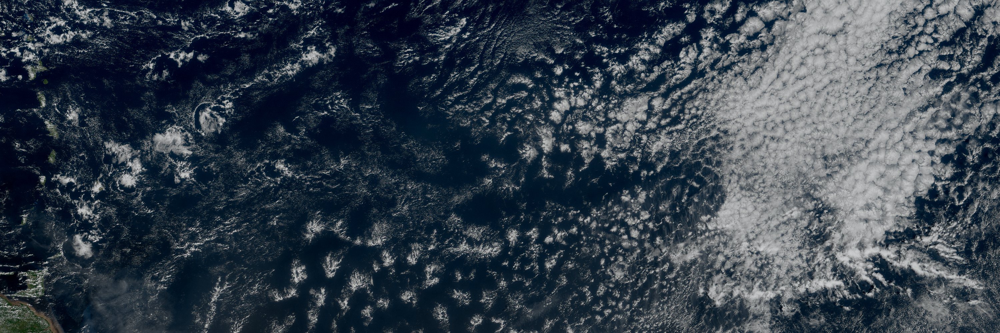

In [2]:
img_scene = Image.open("../../doc/goes16_202002051400.png")
img_scene

In [3]:
model = load_pretrained_model(PretrainedModel.FIXED_NORM_STAGE2)

Using downloaded and verified file: data/fixednorm-stage-2.tgz
Extracting data/fixednorm-stage-2.tgz to data/
Weights loaded from `data/fixednorm-stage-2.torch.pkl`


In [4]:
da_emb = make_sliding_tile_model_predictions(img=img_scene, model=model, step=(100, 100))

100%|██████████| 7/7 [00:20<00:00,  2.91s/it]


To get an idea of the embedding vectors we've produced we can plot the first component of the embedding vectors at each point an overlay on the original image

In [5]:
da_emb

<xarray.DataArray (emb_dim: 100, i0: 28, j0: 8)>
array([[[-7.59835541e-03, -1.07983649e-02, -3.69341597e-02, ...,
         -4.32972386e-02, -1.59139372e-02,  9.19026583e-02],
        [ 1.51635902e-02, -4.39948053e-04, -2.03788504e-02, ...,
         -8.85743089e-03, -5.80622861e-03,  1.68042388e-02],
        [ 7.22846761e-03, -1.09900432e-02,  3.81338759e-03, ...,
          2.07128329e-03,  3.09872115e-03,  7.32760224e-03],
        ...,
        [-2.09191162e-02, -1.37559827e-02,  2.52939388e-02, ...,
         -1.12860296e-02,  2.03732606e-02,  3.80477123e-02],
        [-1.09691722e-02,  8.49931315e-03,  3.18905599e-02, ...,
          4.08389140e-03, -5.71455900e-03,  5.50189381e-03],
        [-6.64188340e-03, -1.36312339e-02, -2.00039265e-03, ...,
          9.70526878e-03, -2.88635050e-03, -1.77456234e-02]],

       [[ 2.50331871e-02, -1.36632072e-02, -2.64286473e-02, ...,
         -3.11447214e-02, -2.70191021e-02,  3.40338005e-03],
        [ 9.84105095e-03, -1.75074674e-02, -2.92871669e-02, ...,
         -6.44459017e-03, -1.90451182e-02, -2.45432332e-02],
        [-1.02270069e-02, -7.49209709e-03, -1.55850900e-02, ...,
         -7.67288124e-03, -2.32817754e-02, -1.65853575e-02],
...
          3.77378277e-02,  8.31467332e-04, -1.16668781e-02],
        [-1.84144601e-02, -3.21556106e-02, -5.55076264e-03, ...,
          2.31251940e-02, -1.25765288e-03, -3.39621715e-02],
        [-4.08114195e-02, -3.75919640e-02, -3.82117145e-02, ...,
         -9.32345167e-03, -2.80022323e-02, -3.72899249e-02]],

       [[ 2.83886623e-02,  1.53907491e-02,  7.19041796e-03, ...,
         -4.93979314e-03, -7.14022107e-03,  5.25537319e-02],
        [ 2.83646733e-02, -2.74593811e-02, -1.96212344e-02, ...,
          2.35078353e-02,  1.62197016e-02, -1.72813272e-03],
        [ 1.63298193e-02, -3.35970372e-02, -3.24419029e-02, ...,
          1.42856045e-02, -1.28160026e-02, -3.60693447e-02],
        ...,
        [ 3.35054584e-02,  2.29397323e-02,  1.72428004e-02, ...,
          4.83292677e-02,  1.71648208e-02,  1.39031457e-02],
        [ 1.12472754e-03, -7.34092994e-03,  8.74354411e-03, ...,
          2.83558425e-02,  2.15813089e-02,  1.85205806e-02],
        [-2.17098976e-03,  6.95938943e-03, -1.04039814e-02, ...,
          4.07362841e-02,  3.47832479e-02,  1.29823731e-02]]],
      dtype=float32)
Coordinates:
  * i0       (i0) int64 128 228 328 428 528 628 ... 2428 2528 2628 2728 2828
  * j0       (j0) int64 128 228 328 428 528 628 728 828
Dimensions without coordinates: emb_dim
Attributes:
    tile_nx:  256
    tile_ny:  256

In [6]:
da_emb.i0 * 10.0

<xarray.DataArray 'i0' (i0: 28)>
array([ 1280.,  2280.,  3280.,  4280.,  5280.,  6280.,  7280.,  8280.,
        9280., 10280., 11280., 12280., 13280., 14280., 15280., 16280.,
       17280., 18280., 19280., 20280., 21280., 22280., 23280., 24280.,
       25280., 26280., 27280., 28280.])
Coordinates:
  * i0       (i0) int64 128 228 328 428 528 628 ... 2428 2528 2628 2728 2828

In [7]:
def set_grid(da, pixel_resolution=1.0, units="km"):
    """
    Replace (i,j)-indexing coordinates with a Cartesian (x,y) grid coordinates
    on the `da` xr.DataArray using the `pixel_resolution` in `units`
    """
    if "x" in da.coords and "y" in da.coords:
        return da
    
    i0 = da.i0
    j0 = da.j0
    da_x = pixel_resolution*i0
    da_y = pixel_resolution*j0
    da_x.attrs["units"] = units
    da_y.attrs["units"] = units
    da.coords["x"] = da_x
    da.coords["y"] = da_y
    da = da.swap_dims(dict(i0="x", j0="y"))
    da.attrs["tile_lx"] = da.tile_nx * pixel_resolution
    da.attrs["tile_ly"] = da.tile_ny * pixel_resolution
    return da

pixel_resolution = 1.0
pixel_units = "km"
da_emb = set_grid(da_emb, pixel_resolution=pixel_resolution, units=pixel_units)

In [8]:
da_emb

<xarray.DataArray (emb_dim: 100, x: 28, y: 8)>
array([[[-7.59835541e-03, -1.07983649e-02, -3.69341597e-02, ...,
         -4.32972386e-02, -1.59139372e-02,  9.19026583e-02],
        [ 1.51635902e-02, -4.39948053e-04, -2.03788504e-02, ...,
         -8.85743089e-03, -5.80622861e-03,  1.68042388e-02],
        [ 7.22846761e-03, -1.09900432e-02,  3.81338759e-03, ...,
          2.07128329e-03,  3.09872115e-03,  7.32760224e-03],
        ...,
        [-2.09191162e-02, -1.37559827e-02,  2.52939388e-02, ...,
         -1.12860296e-02,  2.03732606e-02,  3.80477123e-02],
        [-1.09691722e-02,  8.49931315e-03,  3.18905599e-02, ...,
          4.08389140e-03, -5.71455900e-03,  5.50189381e-03],
        [-6.64188340e-03, -1.36312339e-02, -2.00039265e-03, ...,
          9.70526878e-03, -2.88635050e-03, -1.77456234e-02]],

       [[ 2.50331871e-02, -1.36632072e-02, -2.64286473e-02, ...,
         -3.11447214e-02, -2.70191021e-02,  3.40338005e-03],
        [ 9.84105095e-03, -1.75074674e-02, -2.92871669e-02, ...,
         -6.44459017e-03, -1.90451182e-02, -2.45432332e-02],
        [-1.02270069e-02, -7.49209709e-03, -1.55850900e-02, ...,
         -7.67288124e-03, -2.32817754e-02, -1.65853575e-02],
...
          3.77378277e-02,  8.31467332e-04, -1.16668781e-02],
        [-1.84144601e-02, -3.21556106e-02, -5.55076264e-03, ...,
          2.31251940e-02, -1.25765288e-03, -3.39621715e-02],
        [-4.08114195e-02, -3.75919640e-02, -3.82117145e-02, ...,
         -9.32345167e-03, -2.80022323e-02, -3.72899249e-02]],

       [[ 2.83886623e-02,  1.53907491e-02,  7.19041796e-03, ...,
         -4.93979314e-03, -7.14022107e-03,  5.25537319e-02],
        [ 2.83646733e-02, -2.74593811e-02, -1.96212344e-02, ...,
          2.35078353e-02,  1.62197016e-02, -1.72813272e-03],
        [ 1.63298193e-02, -3.35970372e-02, -3.24419029e-02, ...,
          1.42856045e-02, -1.28160026e-02, -3.60693447e-02],
        ...,
        [ 3.35054584e-02,  2.29397323e-02,  1.72428004e-02, ...,
          4.83292677e-02,  1.71648208e-02,  1.39031457e-02],
        [ 1.12472754e-03, -7.34092994e-03,  8.74354411e-03, ...,
          2.83558425e-02,  2.15813089e-02,  1.85205806e-02],
        [-2.17098976e-03,  6.95938943e-03, -1.04039814e-02, ...,
          4.07362841e-02,  3.47832479e-02,  1.29823731e-02]]],
      dtype=float32)
Coordinates:
    i0       (x) int64 128 228 328 428 528 628 ... 2328 2428 2528 2628 2728 2828
    j0       (y) int64 128 228 328 428 528 628 728 828
  * x        (x) float64 128.0 228.0 328.0 ... 2.628e+03 2.728e+03 2.828e+03
  * y        (y) float64 128.0 228.0 328.0 428.0 528.0 628.0 728.0 828.0
Dimensions without coordinates: emb_dim
Attributes:
    tile_nx:  256
    tile_ny:  256
    tile_lx:  256.0
    tile_ly:  256.0

In [9]:
def vector_norm(x, dim, ord=None):
    return xr.apply_ufunc(
        np.linalg.norm, x, input_core_dims=[[dim]], kwargs={"ord": ord, "axis": -1}
    )

def align_axis_x(ax, ax_target):
    """Make x-axis of `ax` aligned with `ax_target` in figure"""
    posn_old, posn_target = ax.get_position(), ax_target.get_position()
    ax.set_position([posn_target.x0, posn_old.y0, posn_target.width, posn_old.height])
    
def make_extent(da):
    img_extent = [
        da.x.min() - da.tile_lx/2.0,
        da.x.max() + da.tile_lx/2.0,
        da.y.min() - da.tile_ly/2.0,
        da.y.max() + da.tile_ly/2.0
    ]
    return img_extent

<IPython.core.display.Javascript object>


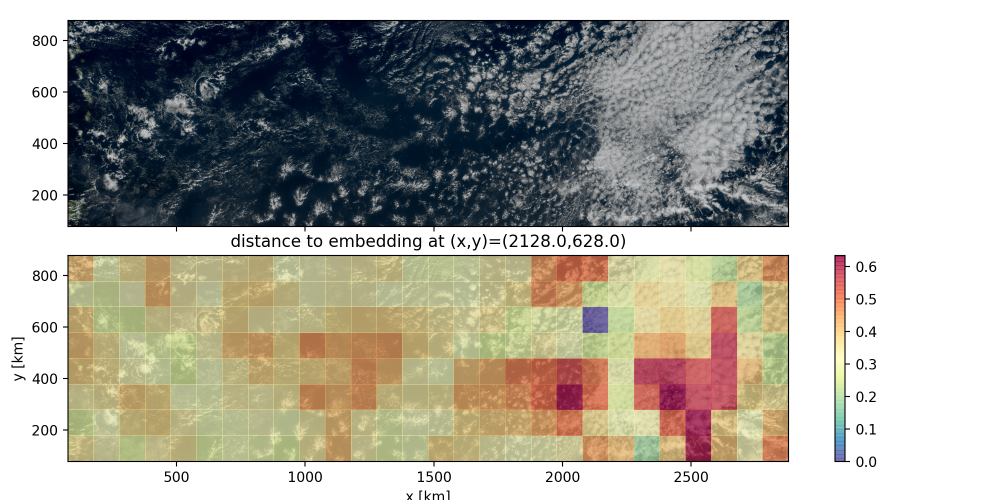

In [10]:
fig, axes = plt.subplots(nrows=2, figsize=(10, 5), sharex=True, sharey=True)

cb = None
def _create_overlaid(da_emb_ref):
    ax_overlay = axes[1]
    ax_overlay.clear()
    ax_overlay.imshow(img_scene, extent=make_extent(da_emb))
    
    da_dist_map = vector_norm(da_emb - da_emb_ref, dim="emb_dim")  
    da_dist_map.name = "emb_dist"
    pcolor = da_dist_map.plot(ax=ax_overlay, alpha=0.7, y="y", add_colorbar=False, cmap="Spectral_r")
    global cb
    if cb is not None:
        cb.remove()
    cb = fig.colorbar(pcolor, ax=ax_overlay)
    ax_overlay.set_title(f"distance to embedding at (x,y)=({da_emb_ref.x.data},{da_emb_ref.y.data})")

fig.tight_layout()
axes[0].imshow(img_scene, extent=make_extent(da_emb))
_create_overlaid(da_emb.isel(x=0, y=0))
[ax.set_aspect(1) for ax in axes]
[align_axis_x(ax, axes[1]) for ax in axes]

  
def onpress(event):
    if event.inaxes is None: return
    da_emb_ref = da_emb.sel(x=event.xdata, y=event.ydata, method="nearest")
    _create_overlaid(da_emb_ref)

cid = fig.canvas.mpl_connect('button_press_event', onpress)